Animal tracking data helps us understand how individuals and populations move within local areas, migrate across oceans and continents and evolve across generations. This information is being used to address environmental challenges such as climate and land use change, biodiversity loss, invasive species, wildlife trafficking and the spread of infectious diseases.

Since the twentieth century, improved communication systems, shrinking battery sizes and other technological developments have led to a range of methods for tracking animals. Scientists have been systematically tracking individual animal movements since around 1900, when the first bird ringing (also known as bird banding) schemes were started. In the late 1950s, researchers began using radio transmitters to track wildlife. In the late 1970s, the Argos satellite system provided a new method for tracking animals globally. And in the early 1990s, the global positioning system (GPS) began to provide the potential to obtain high-resolution tracking data.

Choosing a tracking method involves trade-offs between size, price, and amount and ease of data collection. The ideal tag would be lightweight enough to be safely carried by the animal, cheap enough to put on many individuals, and able to transmit high-resolution data remotely so that the animal did not need to be captured again. In reality, a scientist must choose the best available method based on the size and movement patterns of the study animal, the study budget and the research questions they want to address.

In [1]:
import numpy as np
import pandas as pd
import folium
from folium.map import Icon

In [2]:
df=pd.read_csv('migration_original.csv')

In [3]:
df.head()

,event-id,visible,timestamp,location-long,location-lat,manually-marked-outlier,visible.1,sensor-type,individual-taxon-canonical-name,tag-local-identifier,individual-local-identifier,study-name,ECMWF Interim Full Daily Invariant Low Vegetation Cover,NCEP NARR SFC Vegetation at Surface,ECMWF Interim Full Daily Invariant High Vegetation Cover
0,1082620685,True,2009-05-27 14:00:00.000,24.58617,61.24783,NaN,True,gps,Larus fuscus,91732,91732A,Navigation experiments in lesser black-backed ...,0.039229,NaN,0.960771
1,1082620686,True,2009-05-27 20:00:00.000,24.58217,61.23267,NaN,True,gps,Larus fuscus,91732,91732A,Navigation experiments in lesser black-backed ...,0.040803,NaN,0.959197
2,1082620687,True,2009-05-28 05:00:00.000,24.53133,61.18833,NaN,True,gps,Larus fuscus,91732,91732A,Navigation experiments in lesser black-backed ...,0.052201,NaN,0.947799
3,1082620688,True,2009-05-28 08:00:00.000,24.58200,61.23283,NaN,True,gps,Larus fuscus,91732,91732A,Navigation experiments in lesser black-backed ...,0.040818,NaN,0.959182
4,1082620689,True,2009-05-28 14:00:00.000,24.58250,61.23267,NaN,True,gps,Larus fuscus,91732,91732A,Navigation experiments in lesser black-backed ...,0.040753,NaN,0.959247


In [4]:
df.columns

Index(['event-id', 'visible', 'timestamp', 'location-long', 'location-lat',
       'manually-marked-outlier', 'visible.1', 'sensor-type',
       'individual-taxon-canonical-name', 'tag-local-identifier',
       'individual-local-identifier', 'study-name',
       'ECMWF Interim Full Daily Invariant Low Vegetation Cover',
       'NCEP NARR SFC Vegetation at Surface',
       'ECMWF Interim Full Daily Invariant High Vegetation Cover'],
      dtype='object')

In [5]:
del df['manually-marked-outlier']

In [6]:
del df['visible']

In [32]:
del df['sensor-type']

In [8]:
del df['ECMWF Interim Full Daily Invariant Low Vegetation Cover']
del df['NCEP NARR SFC Vegetation at Surface']
del df['ECMWF Interim Full Daily Invariant High Vegetation Cover']

In [9]:
df.tail()

,event-id,timestamp,location-long,location-lat,visible.1,sensor-type,individual-taxon-canonical-name,tag-local-identifier,individual-local-identifier,study-name
89862,1082710935,2009-08-29 14:00:00.000,35.67700,65.03150,True,gps,Larus fuscus,91930,91930A,Navigation experiments in lesser black-backed ...
89863,1082710936,2009-08-29 20:00:00.000,35.69533,65.02683,True,gps,Larus fuscus,91930,91930A,Navigation experiments in lesser black-backed ...
89864,1082710937,2009-08-30 05:00:00.000,35.67967,65.03167,True,gps,Larus fuscus,91930,91930A,Navigation experiments in lesser black-backed ...
89865,1082710938,2009-08-30 08:00:00.000,35.69700,65.02917,True,gps,Larus fuscus,91930,91930A,Navigation experiments in lesser black-backed ...
89866,1082710939,2009-08-31 05:00:00.000,35.72717,65.01700,True,gps,Larus fuscus,91930,91930A,Navigation experiments in lesser black-backed ...


In [10]:
df.describe()


,event-id,location-long,location-lat,tag-local-identifier
count,8.986700e+04,89867.000000,89867.000000,89867.000000
mean,1.077152e+09,31.091527,31.958247,91809.564356
std,7.135704e+07,8.339180,24.841950,57.286126
min,1.507232e+08,4.025170,-2.406330,91732.000000
25%,1.082617e+09,24.612415,7.998415,91761.000000
50%,1.082645e+09,32.610170,31.171500,91810.000000
75%,1.082677e+09,34.956165,59.762580,91846.000000
max,1.082711e+09,58.522830,65.232500,91930.000000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89867 entries, 0 to 89866
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   event-id                         89867 non-null  int64  
 1   timestamp                        89867 non-null  object 
 2   location-long                    89867 non-null  float64
 3   location-lat                     89867 non-null  float64
 4   visible.1                        89867 non-null  bool   
 5   sensor-type                      89867 non-null  object 
 6   individual-taxon-canonical-name  89867 non-null  object 
 7   tag-local-identifier             89867 non-null  int64  
 8   individual-local-identifier      89867 non-null  object 
 9   study-name                       89867 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(5)
memory usage: 6.3+ MB


In [12]:
df.shape

(89867, 10)

In [13]:
# Define a function to detect outliers using IQR
def detect_outliers_IQR(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = ((data < lower_bound) | (data > upper_bound))
    return outliers

# Select the numerical features for scaling and outlier removal
numerical_features = df.select_dtypes(include=[np.number]).columns

# Detect and remove outliers from each numerical feature in the original DataFrame
for feature in numerical_features:
    outliers = detect_outliers_IQR(df[feature])
    df = df[~outliers]

# Check the cleaned DataFrame
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 86829 entries, 0 to 89866
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   event-id                         86829 non-null  int64  
 1   timestamp                        86829 non-null  object 
 2   location-long                    86829 non-null  float64
 3   location-lat                     86829 non-null  float64
 4   visible.1                        86829 non-null  bool   
 5   sensor-type                      86829 non-null  object 
 6   individual-taxon-canonical-name  86829 non-null  object 
 7   tag-local-identifier             86829 non-null  int64  
 8   individual-local-identifier      86829 non-null  object 
 9   study-name                       86829 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(5)
memory usage: 6.7+ MB
None


In [16]:
pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 46.4 MB/s eta 0:00:00


In [14]:
import matplotlib.pyplot as plt
%matplotlib inline

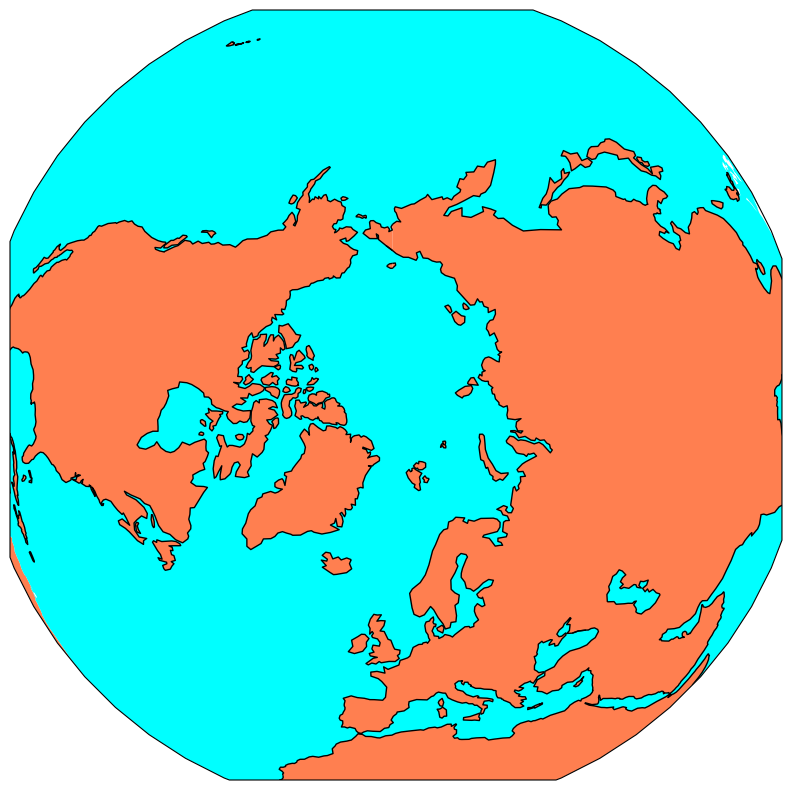

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a GeoAxes in the orthographic projection
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.Orthographic(central_longitude=0, central_latitude=90)})

# Set the extent of the map
ax.set_extent([-180, 180, 20, 90], crs=ccrs.PlateCarree())

# Draw map features
ax.add_feature(cfeature.LAND, facecolor='coral')
ax.add_feature(cfeature.OCEAN, facecolor='aqua')
ax.add_feature(cfeature.COASTLINE)

# Plot points
for i in range(0, 10000000, 1000000):
    ax.plot(i, i, marker='o', color='k', transform=ccrs.PlateCarree())

plt.show()

In [ ]:
pip install geopy

In [17]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from geopy.distance import great_circle

df = df.dropna(subset=['location-lat', 'location-long'])
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['location-lat', 'location-long'])



In [18]:
print(df['location-lat'].isna().sum())
print(df['location-long'].isna().sum())

print(np.isinf(df['location-lat']).sum())
print(np.isinf(df['location-long']).sum())


0
0
0
0


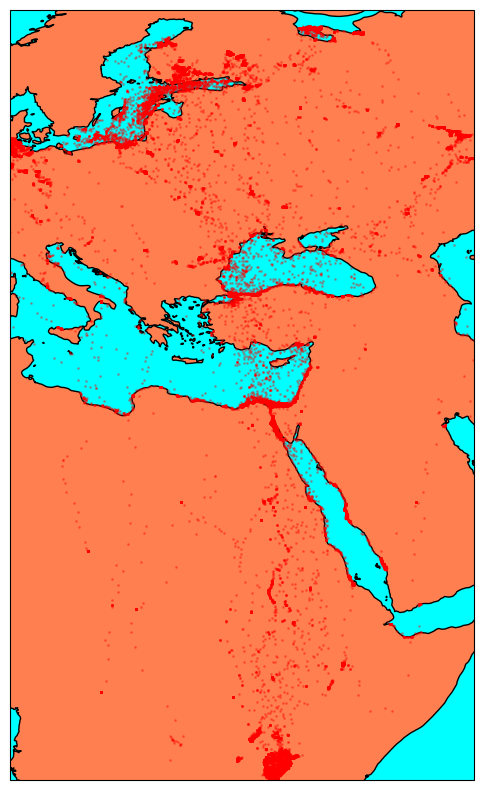

Total distance travelled by animal '91732A': 33023.27077178216 km


In [20]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from geopy.distance import great_circle
import numpy as np


# Remove NaN and Inf values from the DataFrame
df = df.dropna(subset=['location-lat', 'location-long'])
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['location-lat', 'location-long'])

# Calculate the extent of the map after removing NaN and Inf values
LowerLattitude = df['location-lat'].min()
UpperLattitude = df['location-lat'].max()
LowerLontitude = df['location-long'].min()
UpperLontitude = df['location-long'].max()

plt.figure(figsize=(20, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([LowerLontitude, UpperLontitude, LowerLattitude, UpperLattitude])

ax.add_feature(cfeature.LAND, facecolor='coral')
ax.add_feature(cfeature.OCEAN, facecolor='aqua')
ax.add_feature(cfeature.COASTLINE)

# Plot points for all animals
ax.plot(df['location-long'], df['location-lat'], 'ro', markersize=1, alpha=.3, transform=ccrs.PlateCarree())

# Plot points for a specific animal
longs = df[df['individual-local-identifier'] == '91732A']['location-long']
lat = df[df['individual-local-identifier'] == '91732A']['location-lat']
ax.plot(longs, lat, 'ro', markersize=1, alpha=.8, transform=ccrs.PlateCarree())

plt.show()

# Calculate the total distance travelled by the specific animal
distance_travelled = 0
for i in range(len(longs) - 1):
    point1 = (lat.iloc[i], longs.iloc[i])
    point2 = (lat.iloc[i + 1], longs.iloc[i + 1])
    distance_travelled += great_circle(point1, point2).km

print(f"Total distance travelled by animal '91732A': {distance_travelled} km")

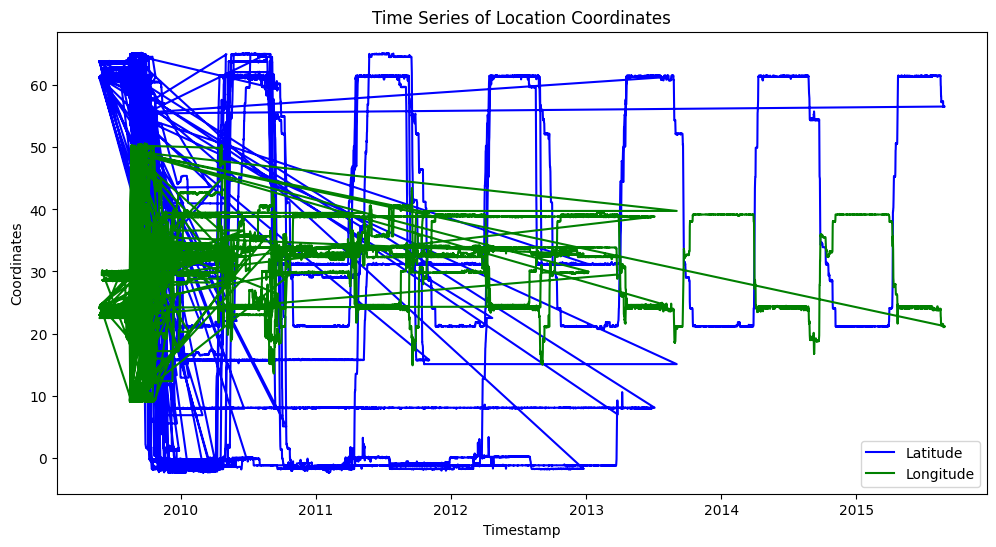

In [21]:
import matplotlib.pyplot as plt

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Plot time series of location coordinates
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['location-lat'], label='Latitude', color='blue')
plt.plot(df['timestamp'], df['location-long'], label='Longitude', color='green')
plt.xlabel('Timestamp')
plt.ylabel('Coordinates')
plt.title('Time Series of Location Coordinates')
plt.legend()
plt.show()


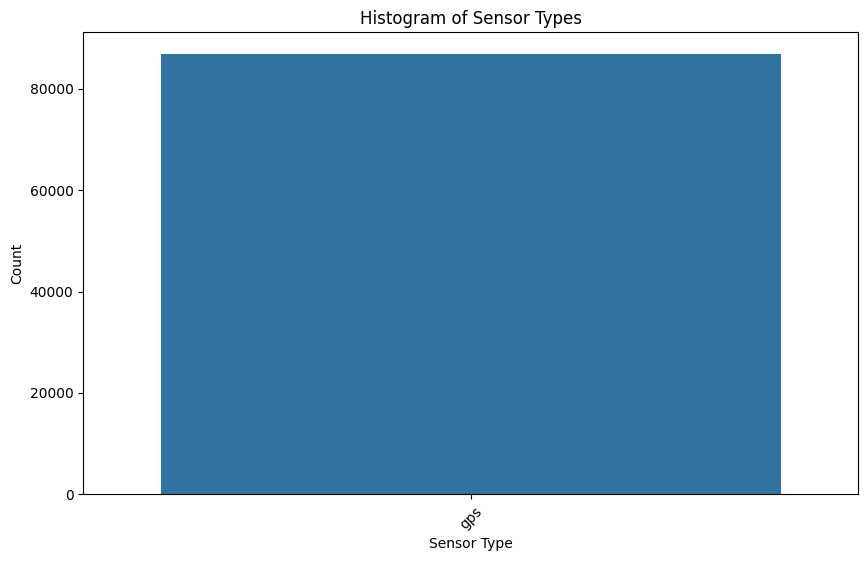

In [22]:
import seaborn as sns

# Plot histogram of sensor types
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='sensor-type')
plt.xlabel('Sensor Type')
plt.ylabel('Count')
plt.title('Histogram of Sensor Types')
plt.xticks(rotation=45)
plt.show()


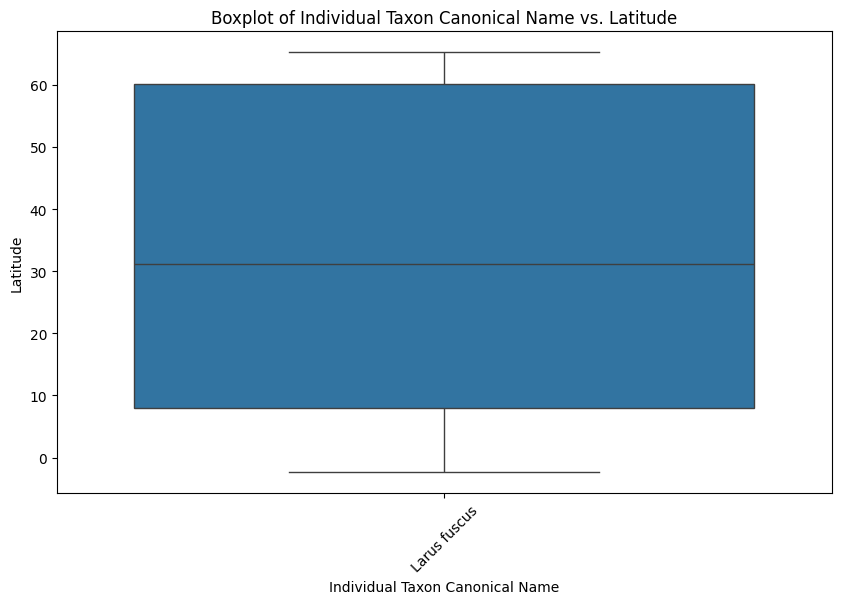

In [23]:
# Plot boxplot of individual taxon canonical name
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='individual-taxon-canonical-name', y='location-lat')
plt.xlabel('Individual Taxon Canonical Name')
plt.ylabel('Latitude')
plt.title('Boxplot of Individual Taxon Canonical Name vs. Latitude')
plt.xticks(rotation=45)
plt.show()


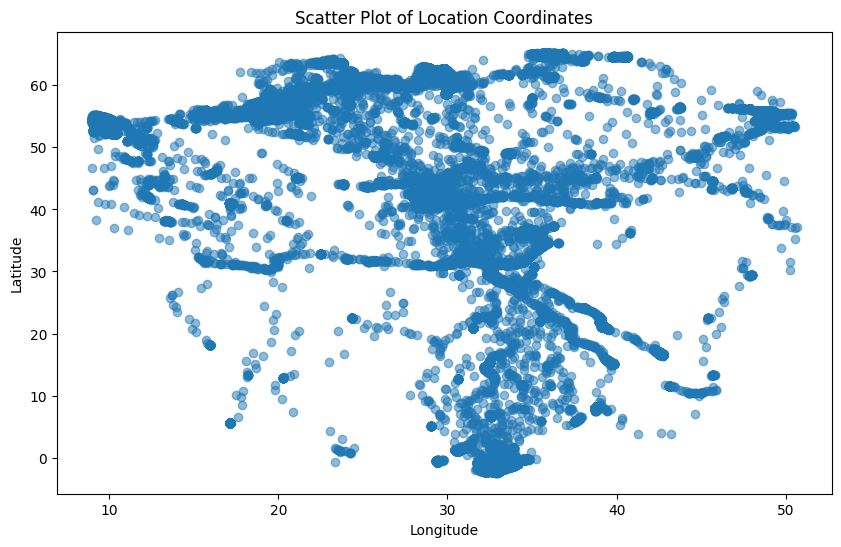

In [24]:
# Plot scatter plot of location coordinates
plt.figure(figsize=(10, 6))
plt.scatter(df['location-long'], df['location-lat'], alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Location Coordinates')
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (1), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (1), which may not be intended.
  func(x=x, y=y, **kwargs)


<Figure size 1000x600 with 0 Axes>

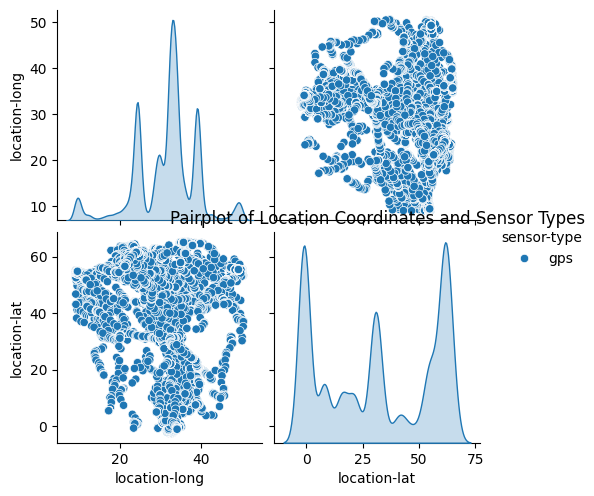

In [25]:
# Select relevant columns for pairplot
df_pairplot = df[['location-long', 'location-lat', 'sensor-type']]

# Plot pairplot
plt.figure(figsize=(10, 6))
sns.pairplot(df_pairplot, hue='sensor-type', markers=["o", "s", "D"], diag_kind='kde')
plt.title('Pairplot of Location Coordinates and Sensor Types')
plt.show()


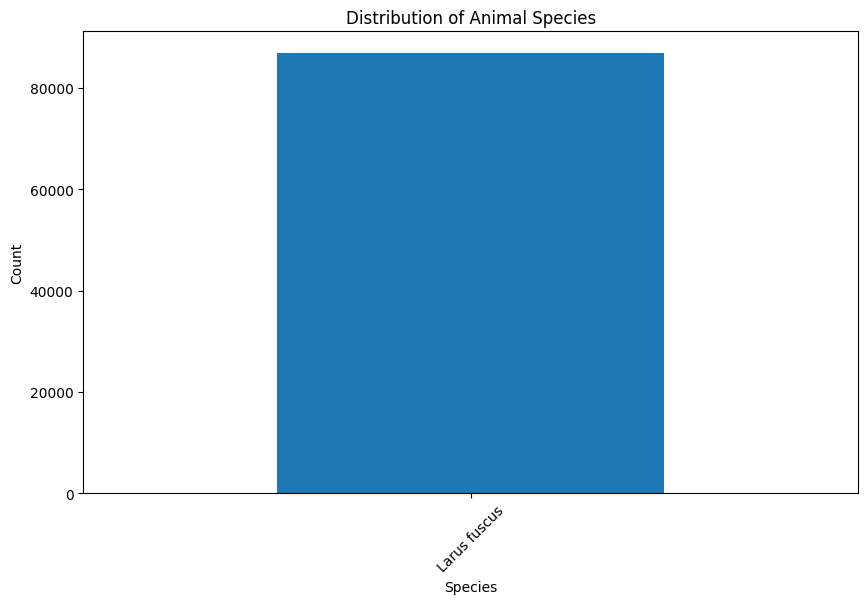

In [30]:
plt.figure(figsize=(10, 6))
df['individual-taxon-canonical-name'].value_counts().plot(kind='bar')
plt.title('Distribution of Animal Species')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


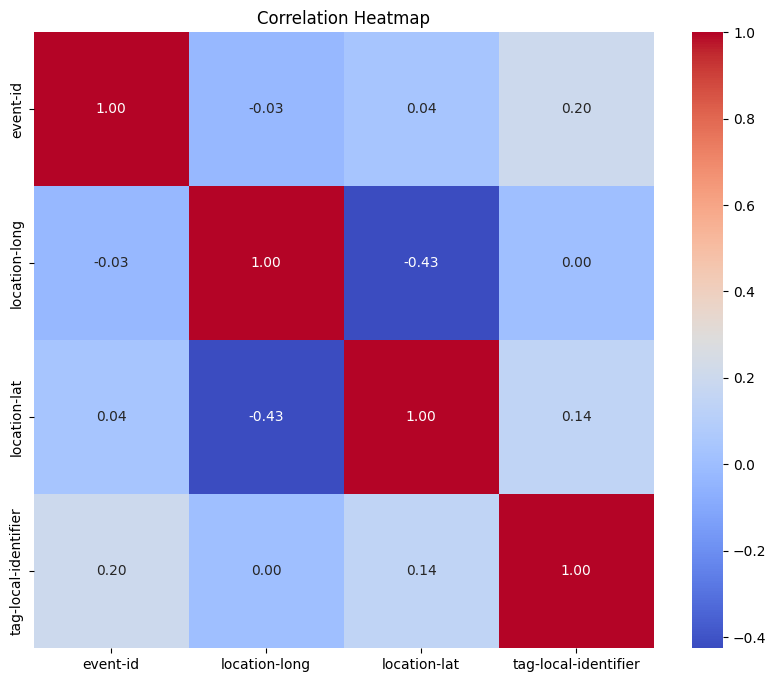

In [34]:
import seaborn as sns

# Select only numeric columns
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Compute correlation matrix
corr_matrix = numeric_df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


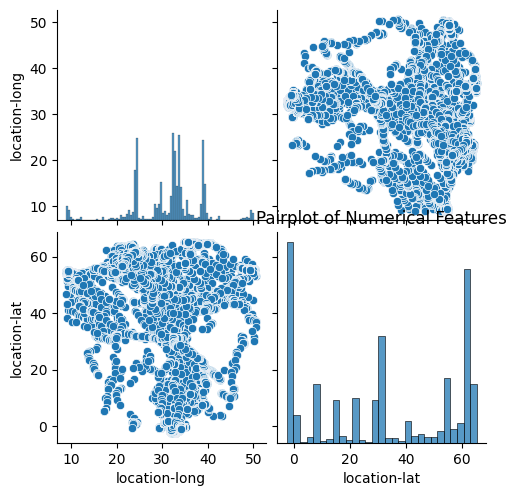

In [35]:
sns.pairplot(df[['location-long', 'location-lat']])
plt.title('Pairplot of Numerical Features')
plt.show()


In [26]:
import plotly.express as px

# Create a scatter plot
fig = px.scatter(df, x='location-long', y='location-lat', title='Animal Tracking')

# Show the plot
fig.show()


In [27]:
# Scatter plot with different attributes
fig1 = px.scatter(df, x='location-long', y='location-lat', color='individual-taxon-canonical-name', title='Animal Tracking - Taxon Name',
                  labels={'location-long': 'Longitude', 'location-lat': 'Latitude', 'individual-taxon-canonical-name': 'Taxon Name'})
fig1.update_layout(plot_bgcolor='black', paper_bgcolor='black', font=dict(color='white'))


# Show the plots
fig1.show()


In [28]:
# Scatter plot with different attributes
fig2 = px.scatter(df, x='location-long', y='location-lat', color='study-name', title='Animal Tracking - Study Name',
                  labels={'location-long': 'Longitude', 'location-lat': 'Latitude', 'study-name': 'Study Name'})
fig2.update_layout(plot_bgcolor='black', paper_bgcolor='black', font=dict(color='white'))

fig2.show()


In [29]:
import folium
from folium.plugins import MarkerCluster

# Create a Folium map centered around the mean latitude and longitude
map_center = [df['location-lat'].mean(), df['location-long'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Create a MarkerCluster layer
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each data point in the dataset
for idx, row in df.iterrows():
    folium.Marker([row['location-lat'], row['location-long']], popup=row['individual-taxon-canonical-name']).add_to(marker_cluster)

# Save the map as an HTML file
m.save('folium_map.html')


In [38]:
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['hour'] = df['timestamp'].dt.hour


In [39]:
df['hour_sin'] = np.sin(2 * np.pi * df['timestamp'].dt.hour / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['timestamp'].dt.hour / 24)


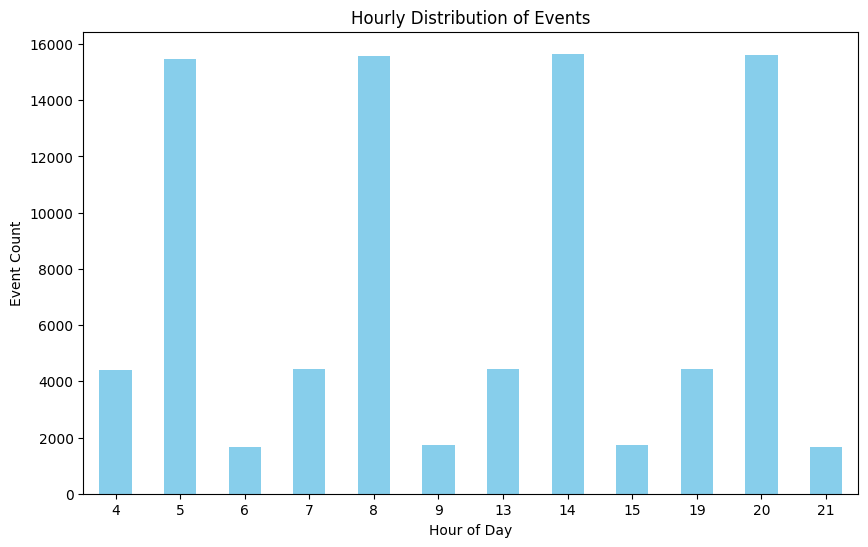

In [43]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
df.groupby('hour').size().plot(kind='bar', color='skyblue')
plt.title('Hourly Distribution of Events')
plt.xlabel('Hour of Day')
plt.ylabel('Event Count')
plt.xticks(rotation=0)
plt.show()


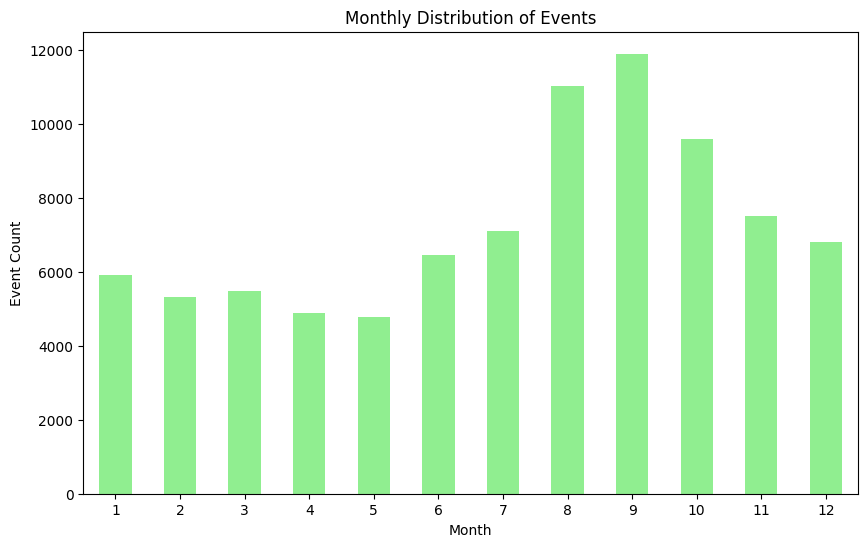

In [44]:
plt.figure(figsize=(10, 6))
df.groupby('month').size().plot(kind='bar', color='lightgreen')
plt.title('Monthly Distribution of Events')
plt.xlabel('Month')
plt.ylabel('Event Count')
plt.xticks(rotation=0)
plt.show()


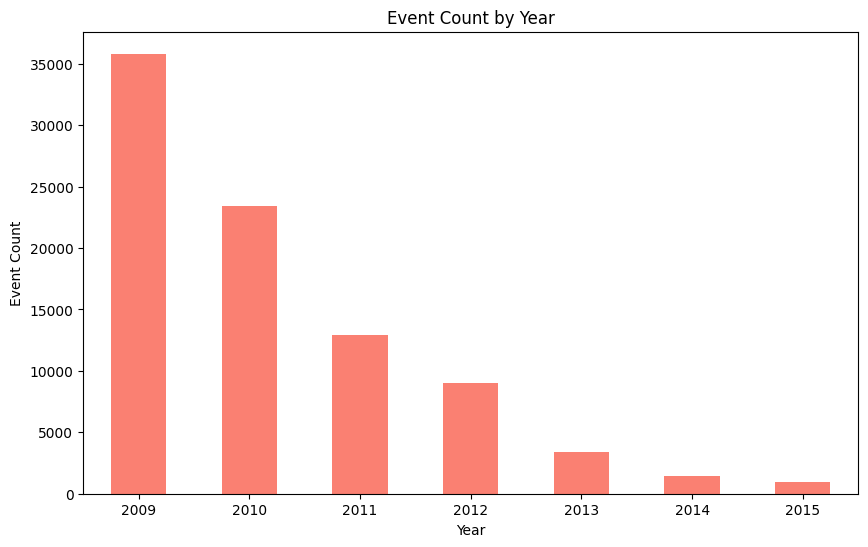

In [45]:
plt.figure(figsize=(10, 6))
df.groupby('year').size().plot(kind='bar', color='salmon')
plt.title('Event Count by Year')
plt.xlabel('Year')
plt.ylabel('Event Count')
plt.xticks(rotation=0)
plt.show()


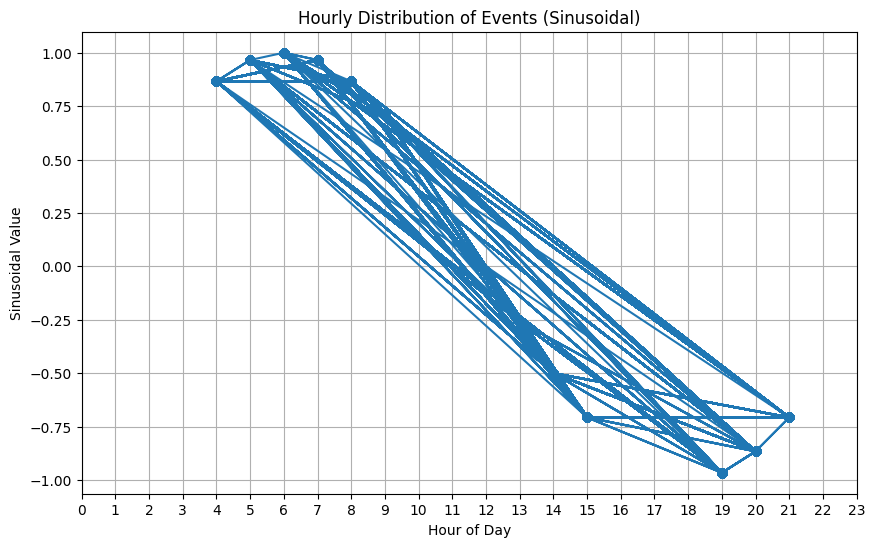

In [46]:
plt.figure(figsize=(10, 6))
plt.plot(df['hour'], df['hour_sin'], marker='o', linestyle='-')
plt.title('Hourly Distribution of Events (Sinusoidal)')
plt.xlabel('Hour of Day')
plt.ylabel('Sinusoidal Value')
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()


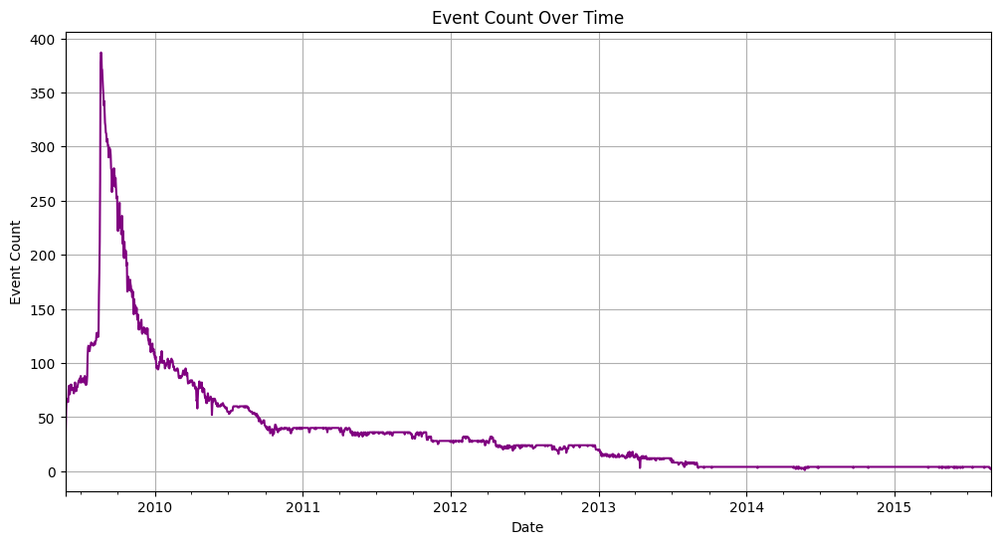

In [47]:
import matplotlib.pyplot as plt

# Set the timestamp column as the index
df['timestamp'] = pd.to_datetime(df['timestamp'])
df.set_index('timestamp', inplace=True)

# Resample the data to get event counts per day
event_count_per_day = df.resample('D').size()

# Plot the event count over time
plt.figure(figsize=(12, 6))
event_count_per_day.plot(color='purple')
plt.title('Event Count Over Time')
plt.xlabel('Date')
plt.ylabel('Event Count')
plt.grid(True)
plt.show()


In [50]:
import plotly.express as px

# Plot the scatter plot for time features with black background and green dots
fig = px.scatter(df, x='hour_sin', y='hour_cos', color='visible.1')
fig.update_traces(marker=dict(color='green'), selector=dict(mode='markers'))
fig.update_layout(plot_bgcolor='black')
fig.show()


In [51]:
import plotly.express as px

# Create a scatter plot for taxonomical name coordinates at a certain hour, month, or year
fig = px.scatter(df, x='location-long', y='location-lat', color='hour',
                 hover_name='individual-taxon-canonical-name',
                 animation_frame='year', animation_group='individual-taxon-canonical-name',
                 title='Taxonomical Name Coordinates by Hour and Year')
fig.update_layout(title_x=0.5)
fig.show()


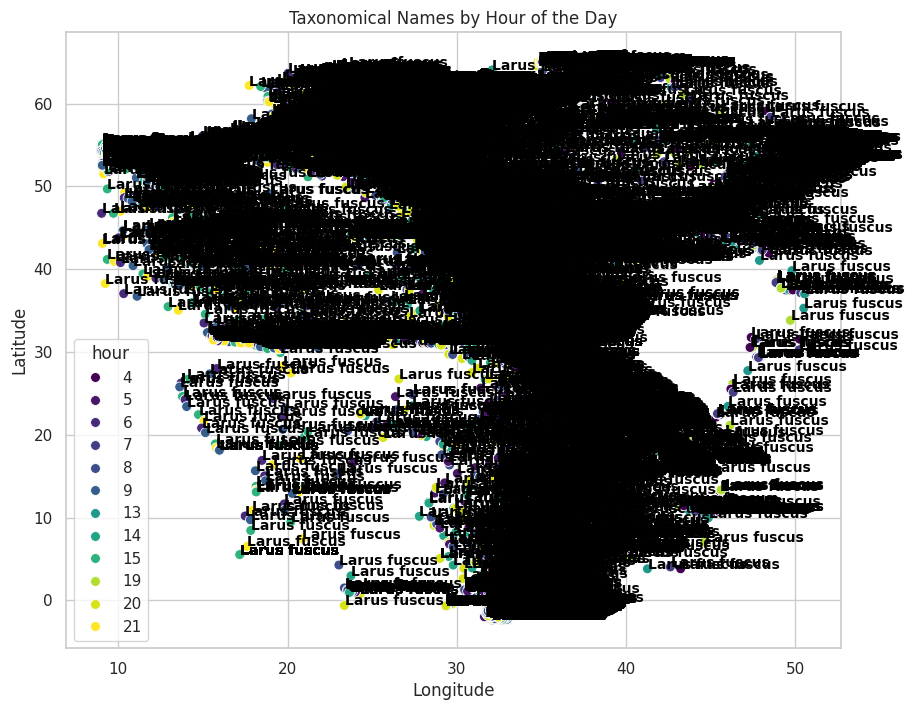

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns


# Set the style for the plot
sns.set(style="whitegrid")

# Create a scatter plot with hue for the hour of the day
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(x='location-long', y='location-lat', hue='hour', palette='viridis',
                          data=df, legend='full', s=50)

# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Taxonomical Names by Hour of the Day')

# Add taxonomical names as annotations
for i, name in enumerate(df['individual-taxon-canonical-name']):
    plt.text(df['location-long'].iloc[i]+0.01, df['location-lat'].iloc[i]+0.01, name,
             horizontalalignment='left', size='small', color='black', weight='semibold')

# Show the plot
plt.show()

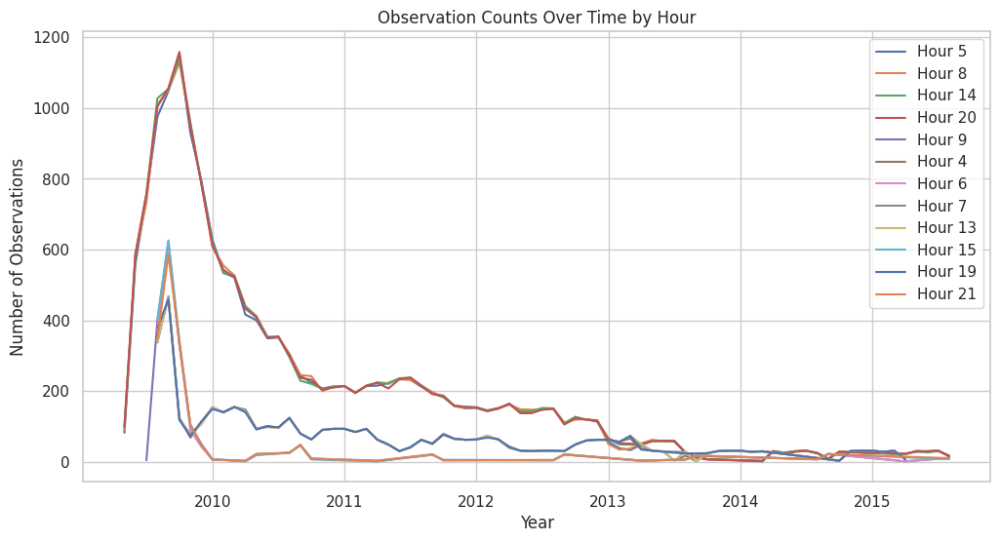

In [54]:
# Aggregate the counts by year, month, and hour
time_counts = df.groupby(['year', 'month', 'hour']).size().reset_index(name='counts')

# Create a line chart for observation counts over time
plt.figure(figsize=(12, 6))
for hour in time_counts['hour'].unique():
    subset = time_counts[time_counts['hour'] == hour]
    plt.plot(subset['year'] + (subset['month'] - 1) / 12.0, subset['counts'], label=f'Hour {hour}')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Number of Observations')
plt.title('Observation Counts Over Time by Hour')
plt.legend()

# Show the plot
plt.show()

In [55]:
import plotly.express as px

# Create an interactive scatter plot with Plotly
fig = px.scatter(df, x='location-long', y='location-lat', color='hour',
                 hover_name='individual-taxon-canonical-name',
                 title='Interactive Taxonomical Observations by Hour of the Day')
fig.show()

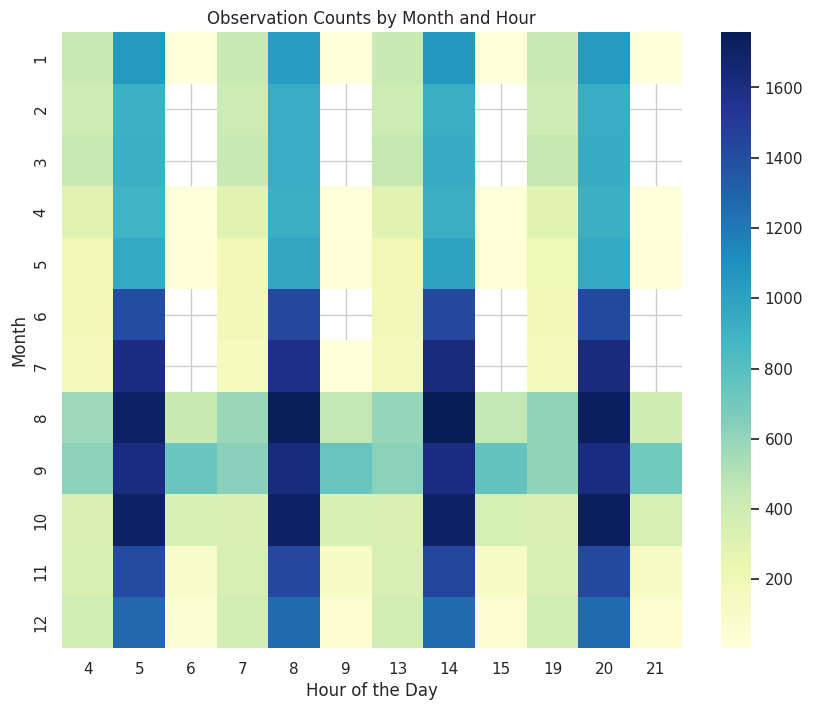

In [56]:
# Pivot the data to get the counts by month and hour
pivot_table = df.pivot_table(values='event-id', index='month', columns='hour', aggfunc='count')

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, cmap='YlGnBu')

# Add labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Month')
plt.title('Observation Counts by Month and Hour')

# Show the plot
plt.show()

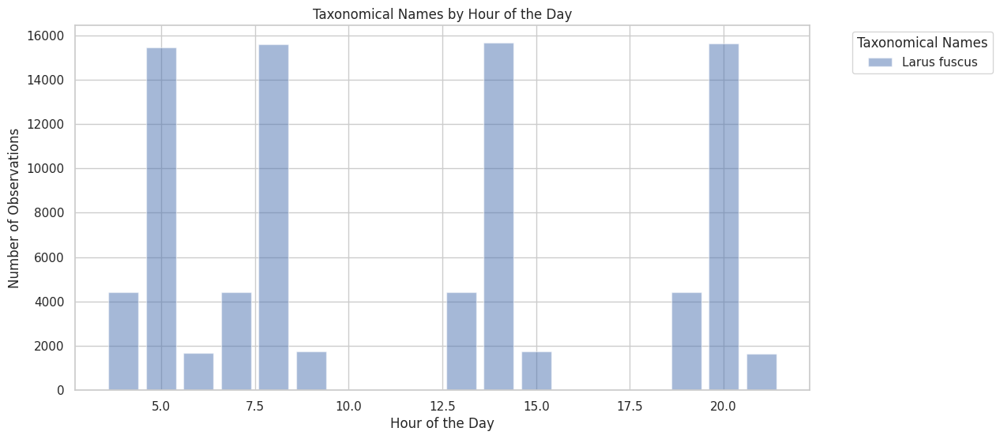

In [57]:
# Count the number of observations for each hour and taxonomical name
hour_counts = df.groupby(['hour', 'individual-taxon-canonical-name']).size().reset_index(name='counts')

# Create a bar chart for each taxonomical name by hour
plt.figure(figsize=(12, 6))
for name in hour_counts['individual-taxon-canonical-name'].unique():
    subset = hour_counts[hour_counts['individual-taxon-canonical-name'] == name]
    plt.bar(subset['hour'], subset['counts'], alpha=0.5, label=name)

# Add labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Observations')
plt.title('Taxonomical Names by Hour of the Day')
plt.legend(title='Taxonomical Names', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

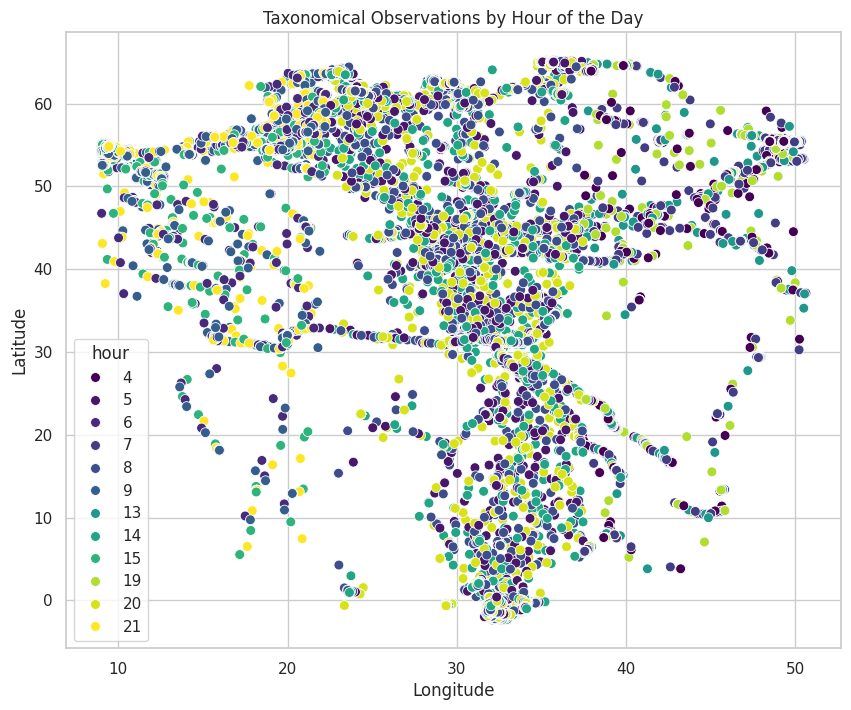

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plot
sns.set(style="whitegrid")

# Create a scatter plot with hue for the hour of the day
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(x='location-long', y='location-lat', hue='hour', palette='viridis',
                          data=df, legend='full', s=50)

# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Taxonomical Observations by Hour of the Day')

# Show the plot
plt.show()

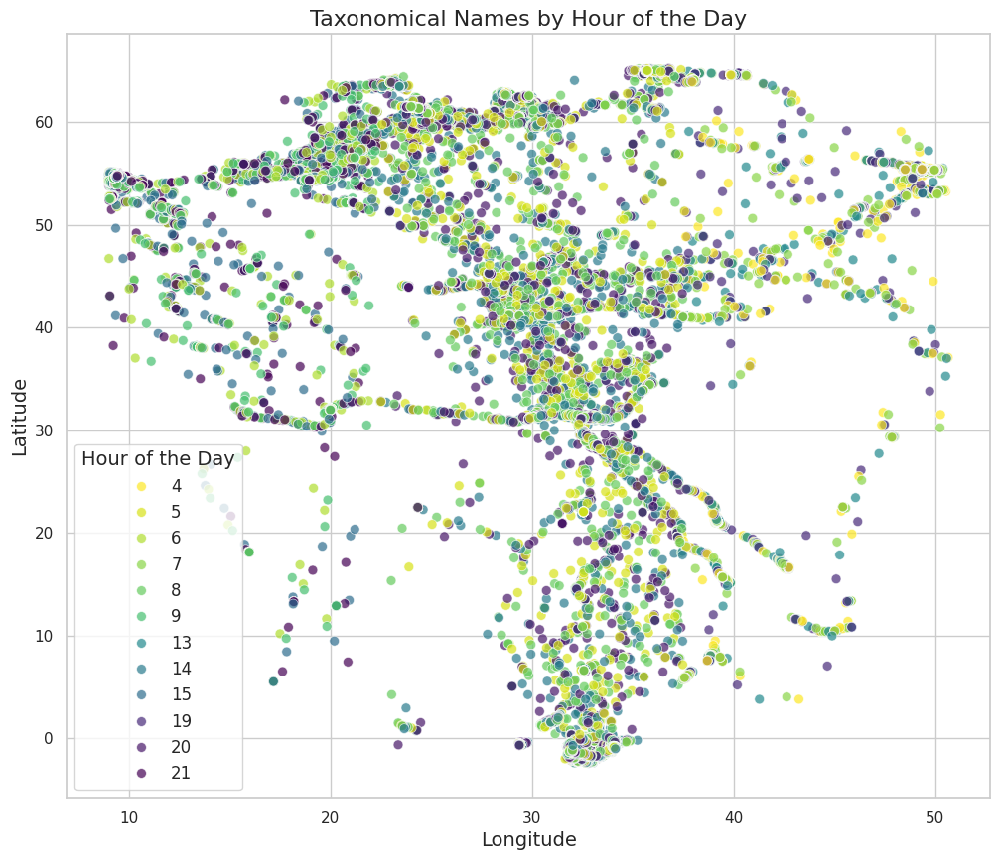

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plot
sns.set(style="whitegrid")

# Create a scatter plot with hue for the hour of the day
plt.figure(figsize=(12, 10))  # Increased figure size
scatter = sns.scatterplot(x='location-long', y='location-lat', hue='hour', palette='viridis_r', alpha=0.7,
                          data=df, legend='full', s=50)

# Add labels and title
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.title('Taxonomical Names by Hour of the Day', fontsize=16)

# Increase the size of the legend text
plt.legend(title='Hour of the Day', title_fontsize='14', fontsize='12')

# Show the plot
plt.show()